# Recursion

[Recursion for Beginners: A Beginner's Guide to Recursion](bit.ly/nbpython2018recursion)

In programming, recursion is when a function calls itself.

Find examples [here](https://github.com/asweigart/recursion_examples
).

## Stacks

A stack is a data structure that holds a sequence of data and only lets you interact with the topmost item.

The “call stack” is a stack of “frame objects”. (frame object == a function call)

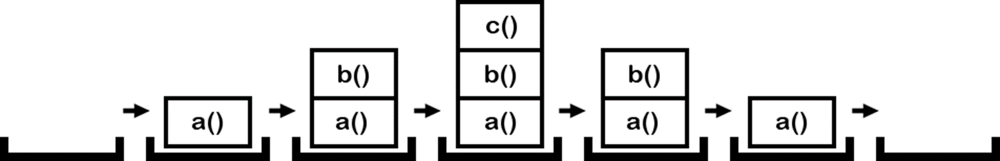

**First-In, Last-Out (FILO)**

In [1]:
def a(): # Exec. 1st
    print('Start of a()') # Exec. 2nd
    b() # Exec. 3rd
    print('End of a()') # Exec. 11th

def b(): # Exec. 4th
    print('Start of b()') # Exec. 5th
    c() # Exec. 6th
    print('End of b()') # Exec. 10th

def c(): # Exec. 7th
    print('Start of c()') # Exec. 8th
    print('End of c()') # Exec. 9th

a()

Start of a()
Start of b()
Start of c()
End of c()
End of b()
End of a()


## Example 1 - Factorial

In [8]:
def factorial(x):
    if x == 1:
        return 1 # BASE CASE
    # RECURSIVE CASE
    return x * factorial(x - 1)

print(factorial(6))
print(factorial(5))
print(factorial(4))

720
120
24


**Note**: Your recursive function must always have at least one base case and one recursive case.

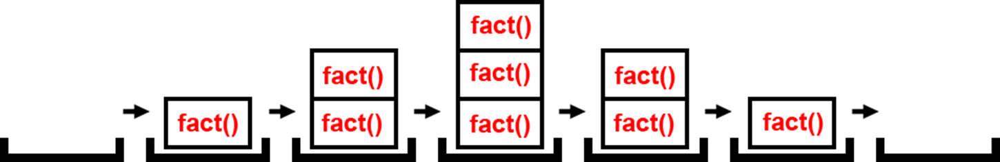

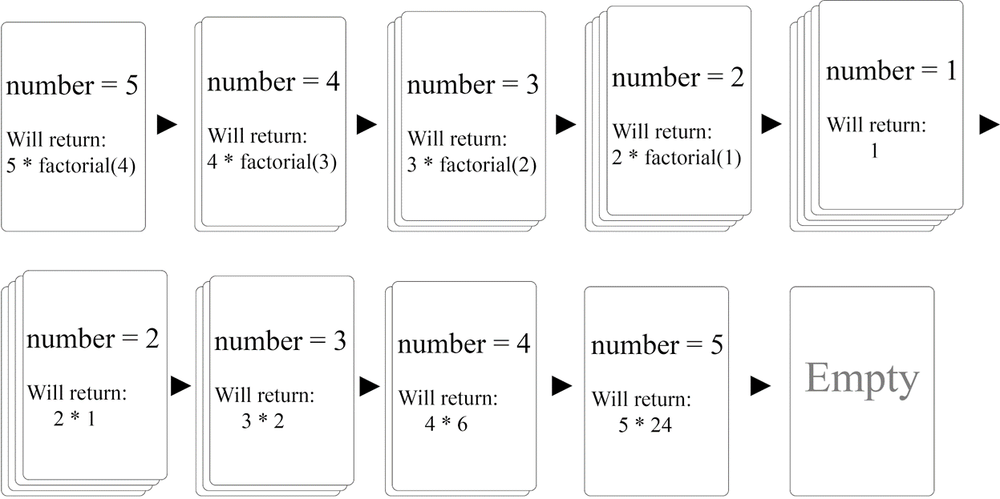

In [12]:
# Iterative factorial algorithm
def factorial(number):
    total = 1
    for i in range(1, number+1):
        total *= i
    return total

print(factorial(5))

120


In [11]:
# Hard-coded pseudo-recursive algorithm
def factorial5():
    return 5 * factorial4()
def factorial4():
    return 4 * factorial3()
def factorial3():
    return 3 * factorial2()
def factorial2():
    return 2 * factorial1()
def factorial1():
    return 1
print(factorial5())

120


In [13]:
# Using iteration to emulate recursion.
callStack = [] # The explicit call stack, which holds "frame objects".
callStack.append({'instrPtr': 'start', 'number': 5}) # "Call" the "factorial() function"
returnValue = None

while len(callStack) > 0:
    # The body of the "factorial() function":

    number = callStack[-1]['number'] # Set number "parameter".
    instrPtr = callStack[-1]['instrPtr']

    if instrPtr == 'start':
        if number == 1:
            # BASE CASE
            returnValue = 1
            callStack.pop() # "Return" from "function call".
            continue
        else:
            # RECURSIVE CASE
            callStack[-1]['instrPtr'] = 'after recursive call'
            # "Call" the "factorial() function":
            callStack.append({'instrPtr': 'start', 'number': number - 1})
            continue
    elif instrPtr == 'after recursive call':
        returnValue = number * returnValue
        callStack.pop()  # "Return from function call".
        continue

print(returnValue)

120


## When To Use Recursion

Both are required:
- When the problem has a tree-like structure.
- When the problem requires backtracking.

## Tail Call Optimization/Elimination

What if the problem is big enough that it really does require more than 1000 function calls?

In [19]:
def factorial(x):
    if x == 1:
        return 1 # BASE CASE
    # RECURSIVE CASE
    return x * factorial(x - 1)

print(factorial(1001))

4027896473371708673172461363569269897050942390749253471763437103403684509110276496126362526954563742052804685988073932546902985398678033674602251534996145355884219285911608336787424513549159212522992854569462713969958504379595406450196963727411427873474502813253243738244563002268716094314978269894891095227257916911679456985092824215386329665233766798918236969009820752231882794651940654891114985865229975733078380579349947062129342914778822214649140587458081797951300189691756057398242372476845127901696480137781586615203849163572855472196603375040679100879363015808746623675439212889882082619448341783691698056824894205040383345293891778450896795460750233058540061412562886338200799403953292515637883994046529021545193029283651694523835310307556845785038514881540923235761503115693258911901059261187616071002868279304729449132724208250789121587415898501360170308879754529224348896887758833869778252159044236824789433138060721440974324186958074125712923087398024810894070025239550801481840628104475

In code, tail call optimization/elimination is when the recursive function call is the last thing in the function before it returns:

```python
def recursiveFunc(params):
    # blah blah blah
    return recursiveFunc(params) # RECURSIVE CASE
```
(The recursive function call comes at the “tail” of the function.)

You won’t need to hold on to local variables, because there’s no code after the recursive function call that will need them.

There’s no need to keep the frame object on the call stack. 

You can go beyond 1000 function calls because the call stack isn’t growing.

TCO prevents stack overflows.

In [24]:
# Unoptimized
def factorial(number):
    if number == 1:
        # BASE CASE
        return 1
    else:
        # RECURSIVE CASE
        return number * factorial(number - 1)
    
print(factorial(1000))

# Optimized
def factorial(number, accumulator=1):
    if number == 0:
        # BASE CASE
        return accumulator
    else:
        # RECURSIVE CASE
        return factorial(number - 1, number * accumulator)

print(factorial(1000))

4023872600770937735437024339230039857193748642107146325437999104299385123986290205920442084869694048004799886101971960586316668729948085589013238296699445909974245040870737599188236277271887325197795059509952761208749754624970436014182780946464962910563938874378864873371191810458257836478499770124766328898359557354325131853239584630755574091142624174743493475534286465766116677973966688202912073791438537195882498081268678383745597317461360853795345242215865932019280908782973084313928444032812315586110369768013573042161687476096758713483120254785893207671691324484262361314125087802080002616831510273418279777047846358681701643650241536913982812648102130927612448963599287051149649754199093422215668325720808213331861168115536158365469840467089756029009505376164758477284218896796462449451607653534081989013854424879849599533191017233555566021394503997362807501378376153071277619268490343526252000158885351473316117021039681759215109077880193931781141945452572238655414610628921879602238389714760

## Example 2 - Fibonacci Sequence

In [30]:
def fib(n):
    if n == 2 or n == 1:
        # BASE CASE
        return 1
    # RECURSIVE CASE
    return fib(n-1) + fib(n-2)

print(fib(9))

34


Repetitive computation of the same number:

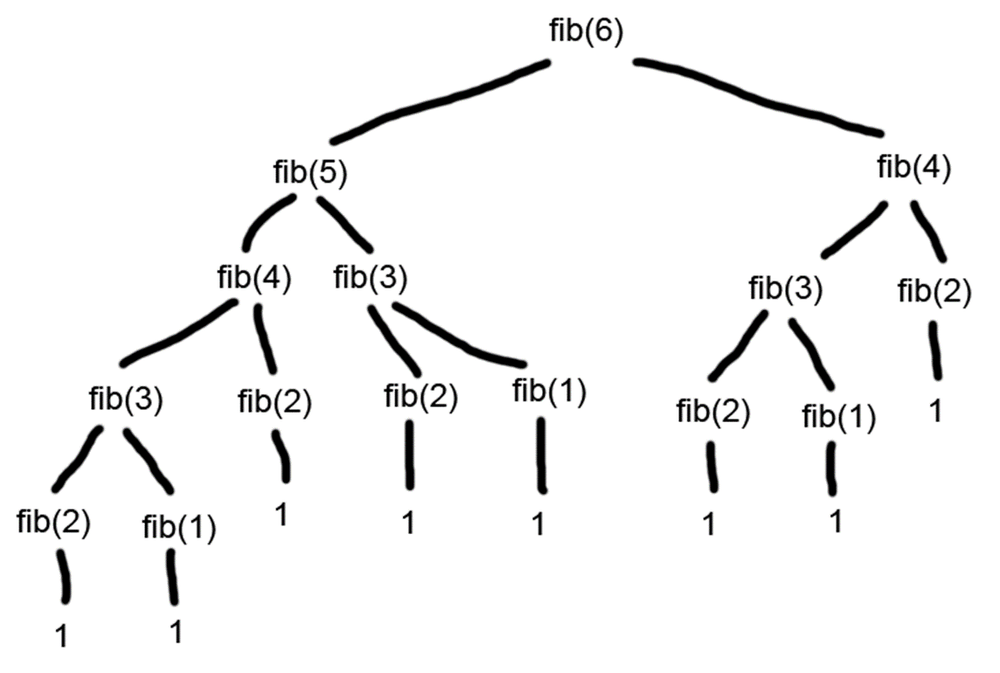
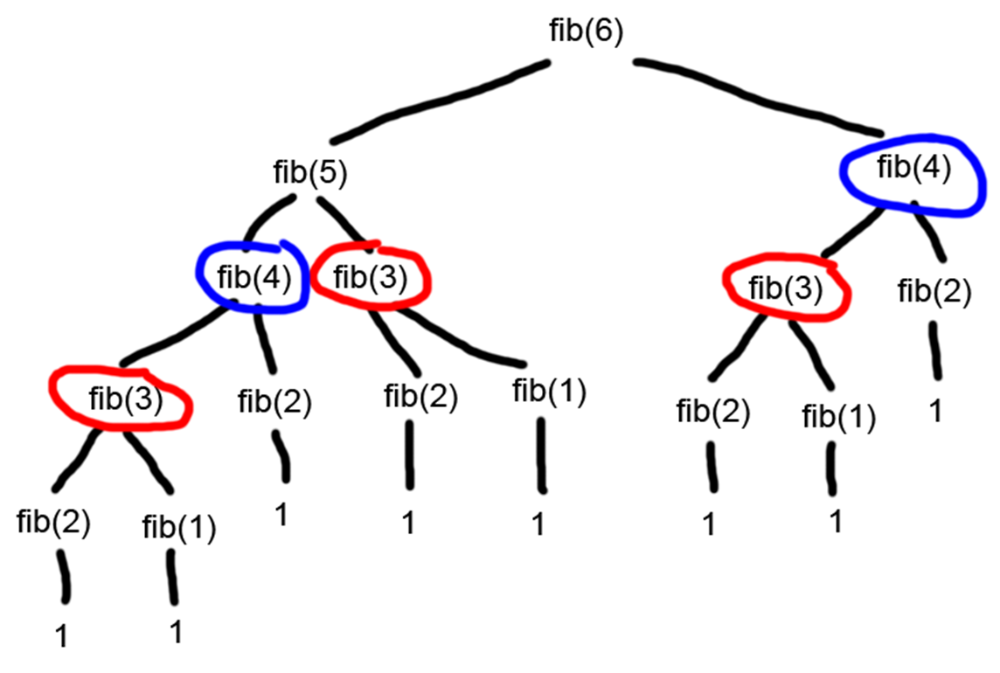
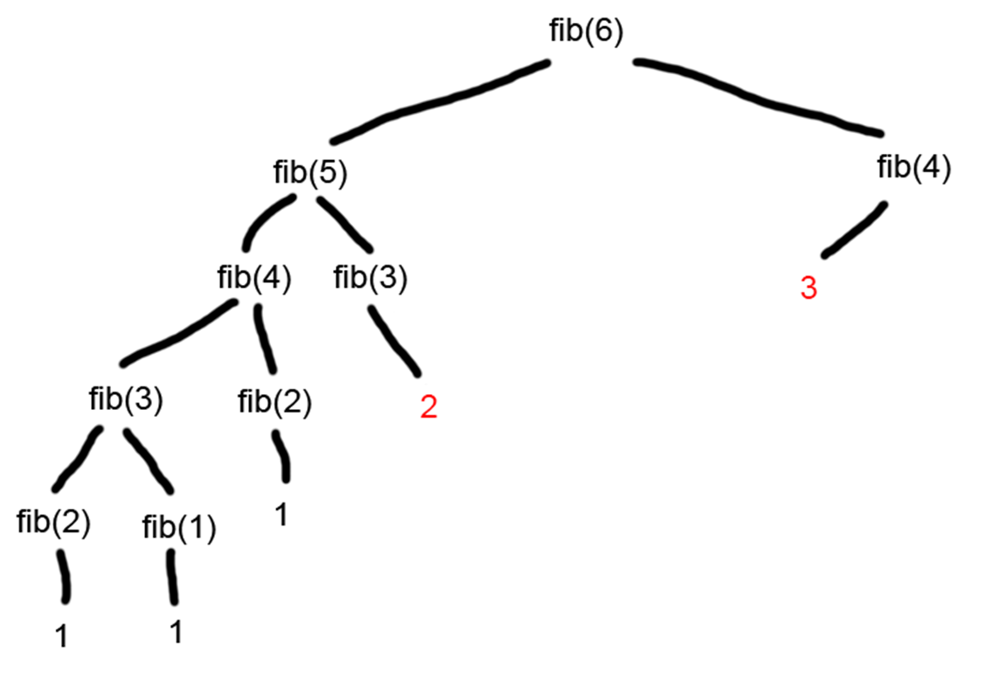

### Recursive Fibonacci with Memoization

In [ ]:
FIB_CACHE = {}

def fib(nthNumber):
  if nthNumber in FIB_CACHE:
    return FIB_CACHE[nthNumber]

  if nthNumber == 1 or nthNumber == 2:
    # BASE CASE
    return 1
  else:
    # RECURSIVE CASE
    FIB_CACHE[nthNumber] = fib(nthNumber - 2) + fib(nthNumber - 1)
    return FIB_CACHE[nthNumber]

In [ ]:
import functools

# lru_cache (LRU = Least Recently Used) performs the same caching operation
@functools.lru_cache()
def fib(nthNumber):
    if nthNumber == 1 or nthNumber == 2:
        # BASE CASE
        return 1
    else:
        # RECURSIVE CASE
        return fib(nthNumber - 2) + fib(nthNumber - 1)

## Example 3 - Triangular Progression

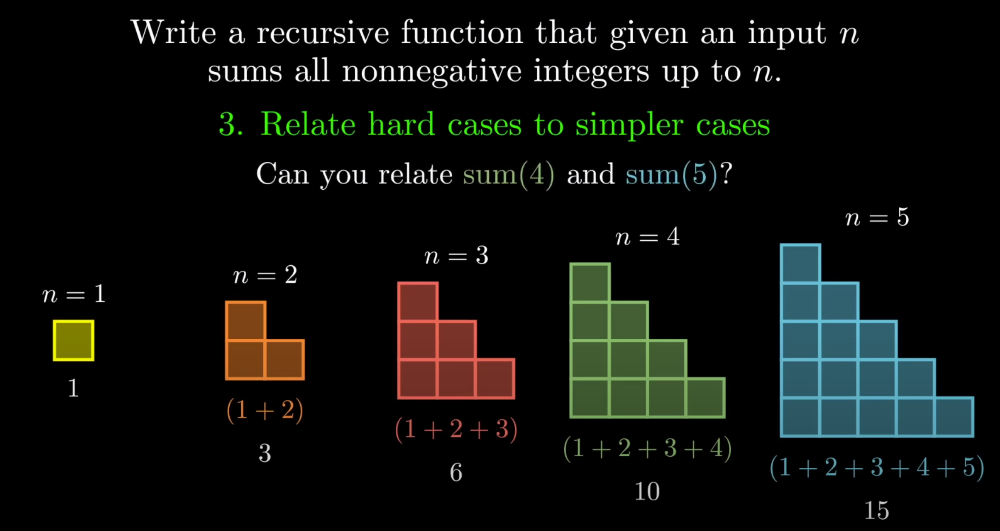

In [12]:
# Iterative Method
def arth(n):
    result = 0
    for i in range(n+1):
        result += i
    return result

arth(5)

15

In [15]:
# Iterative Method
def trig(n):
    counter = 0
    result = 0
    for i in range(n):
        counter += 1
        result += counter
    return result

trig(5)

15

In [44]:
# Mathematical Method
def math(n):
    return n * (n + 1) // 2

math(5)

15

In [46]:
# Recursive Method
def rec(n):
    # BASE CASE
    if n == 1:
        return 1
    # RECURSIVE CASE
    return n + rec(n-1)

rec(5)

15

In [4]:
# Recursive Method - Tail Call Optimized
def rec(n, agg=1):
    # BASE CASE
    if n == 1:
        return agg
    # RECURSIVE CASE
    return rec(n-1, n + agg)

rec(5)

15

## Example 4 - All Paths

Write a function that takes two inputs $n$ and $m$ and outputs the number of unique paths from top left corner to bottom right corner of a $n \times m$ grid.

Constraints: you can only move down or right 1 unit at a time.

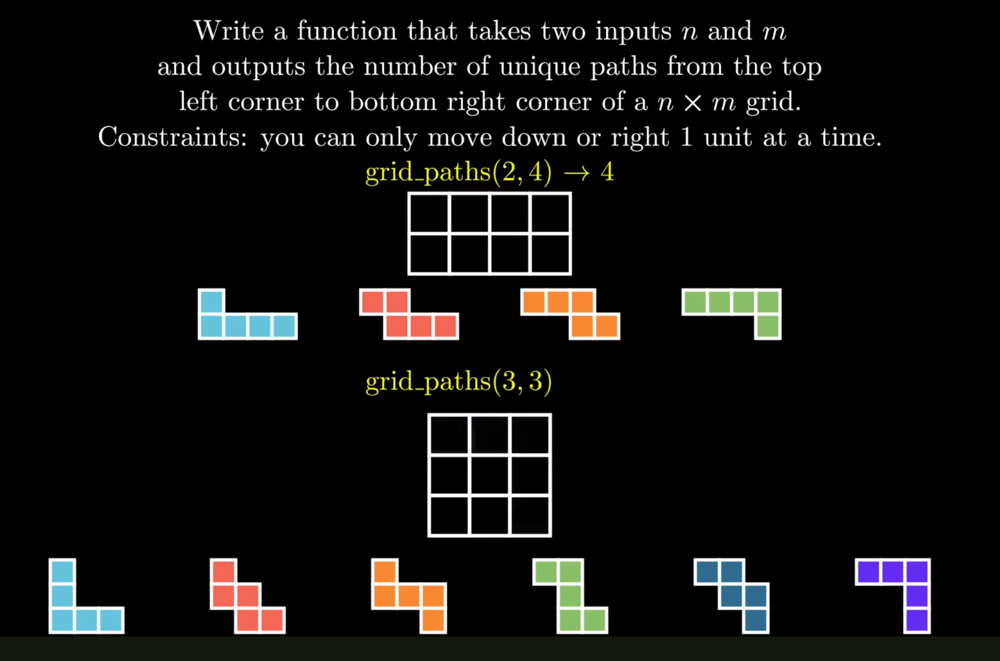

Base Case: *path(n, m)* -> 1 if $n = 1$ or $m = 1$

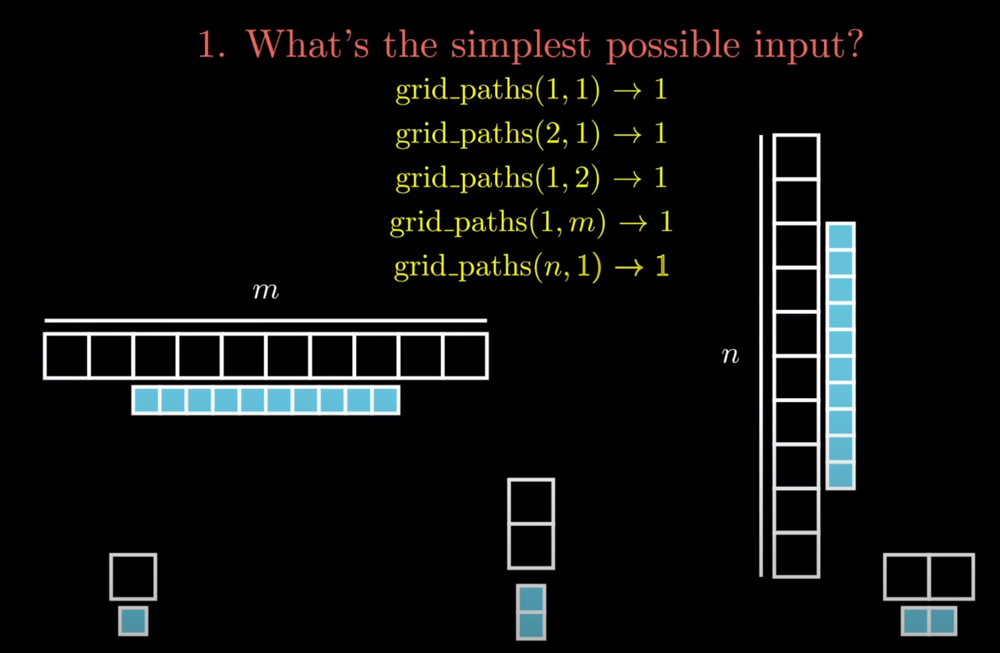

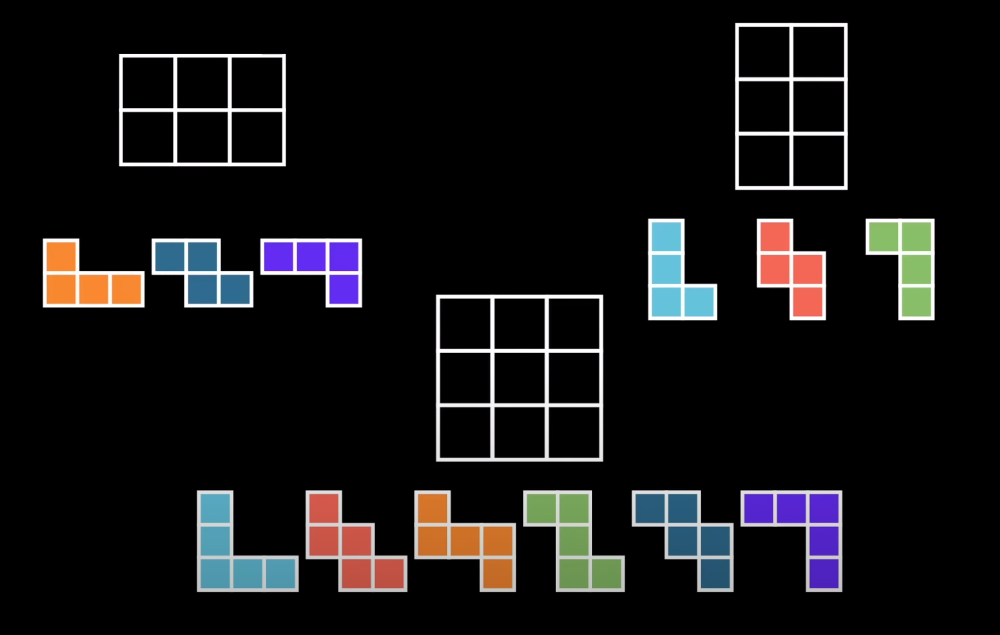

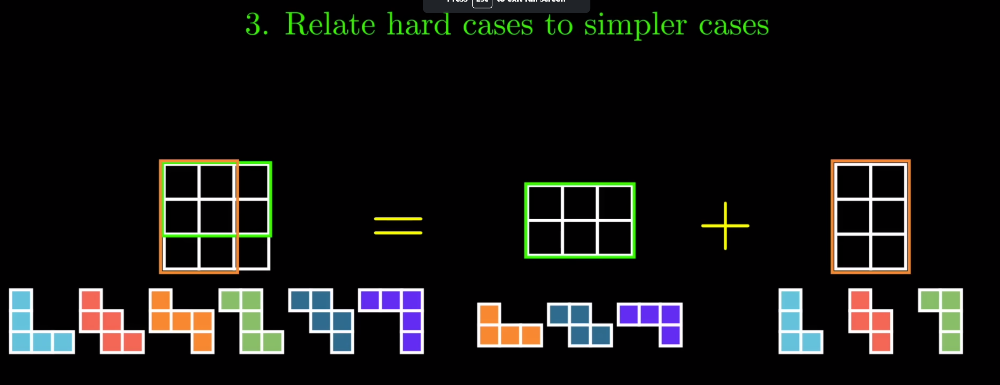

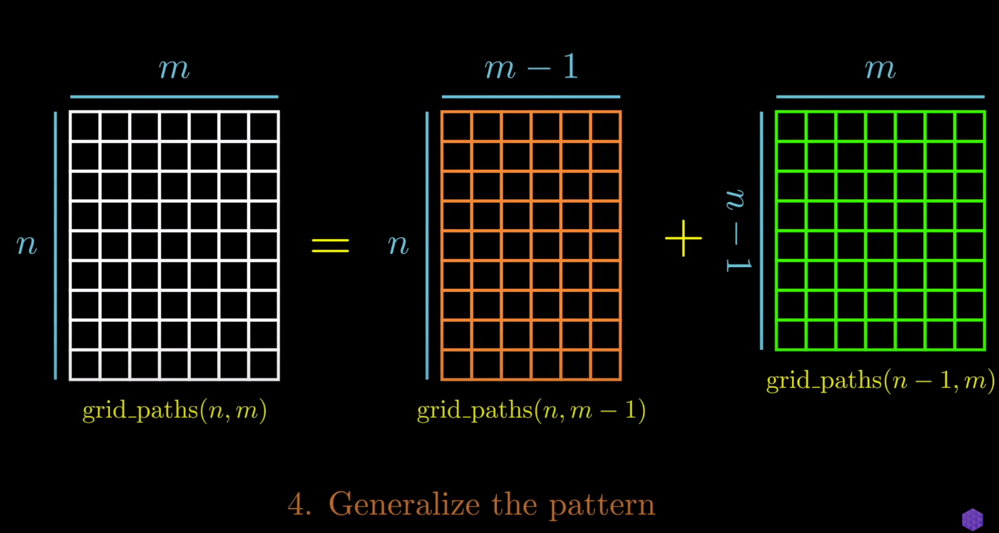

In [1]:
# Mathematical Approach
from math import comb

m, n = 10,5

moves = ["DOWN" for move in range(m-1)]
moves += ["RIGHT" for move in range(n-1)]

print(moves)

if m == n:
    k = 2
else:
    k = min(m,n) - 1

print(comb(m+n-2, k))

['DOWN', 'DOWN', 'DOWN', 'DOWN', 'DOWN', 'DOWN', 'DOWN', 'DOWN', 'DOWN', 'RIGHT', 'RIGHT', 'RIGHT', 'RIGHT']
715


In [21]:
# Mathematical Approach
from math import comb

def paths(m, n):
    if m == n:
        k = 2
    else:
        k = min(m,n) - 1
    
    return comb(m+n-2, k)

paths(10,5)

715

In [20]:
# Recursive Approach
def paths(m, n):
    # BASE CASE
    if m == 1 or n == 1:
        return 1
    # RECURSIVE CASE
    return paths(m-1, n) + paths(m, n-1)

paths(10,5)

715

## Example 5 - All Partitions

Write a function that counts the number of ways you can partition $n$ objects using parts up to $m$ (assuming $m \ge 0$)

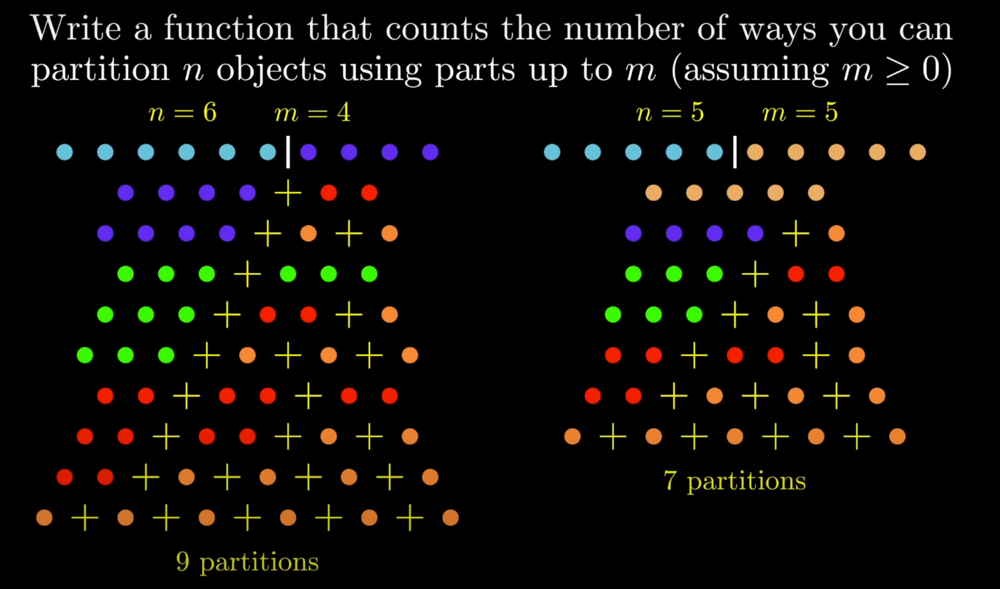

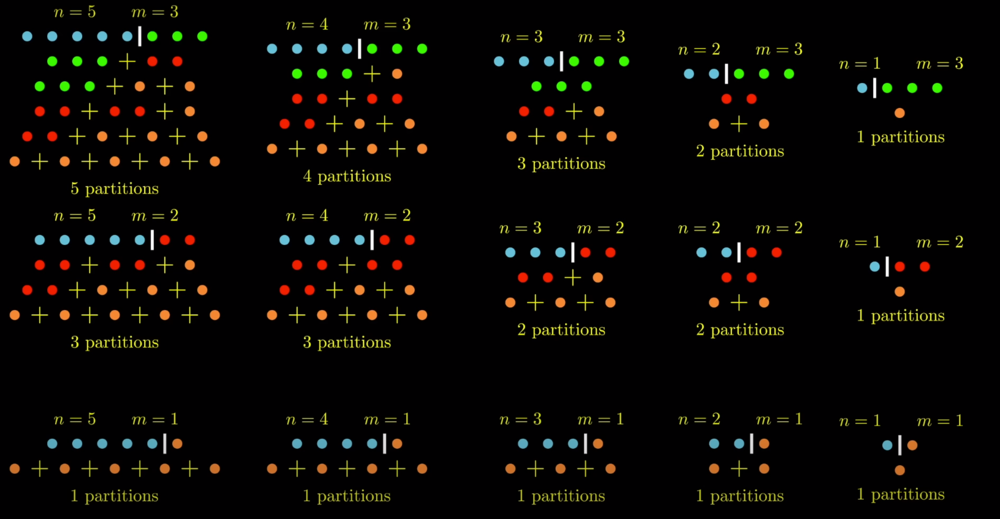

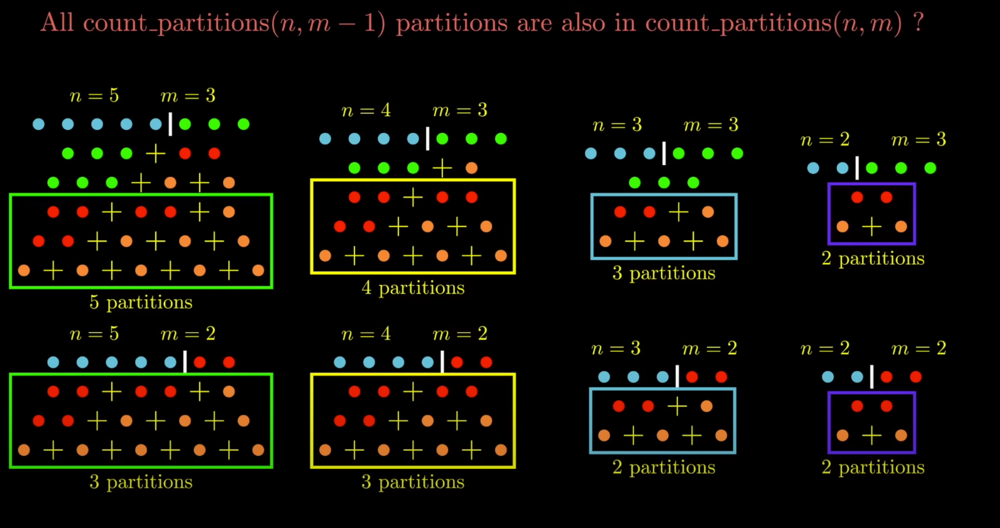

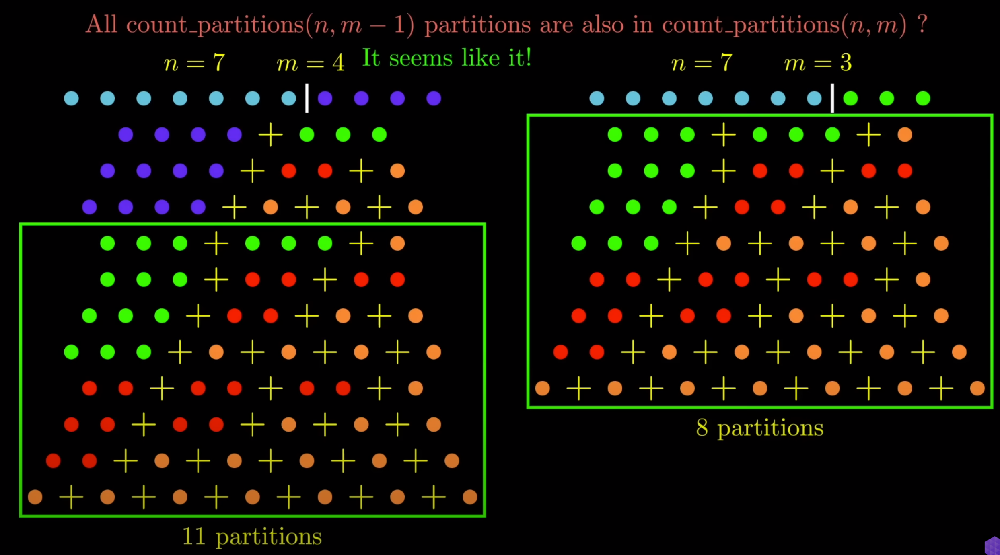

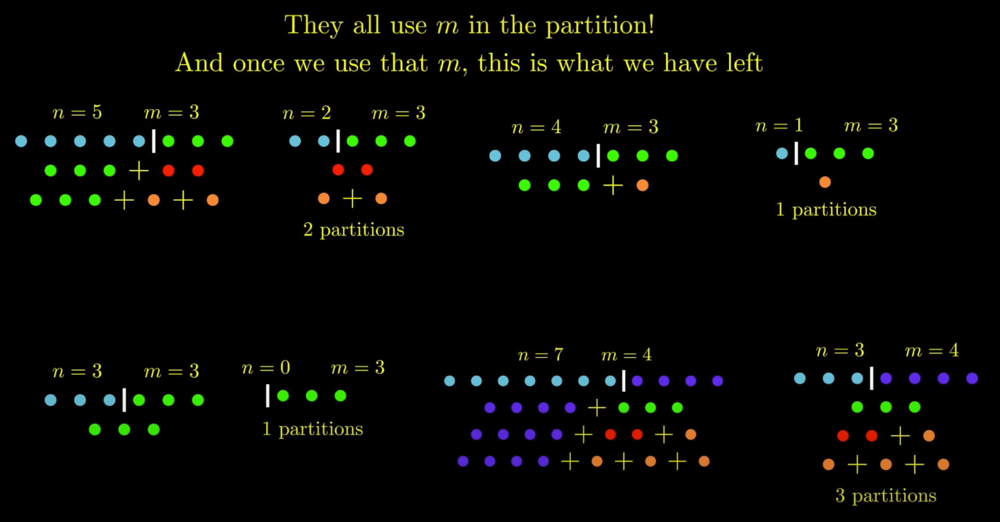

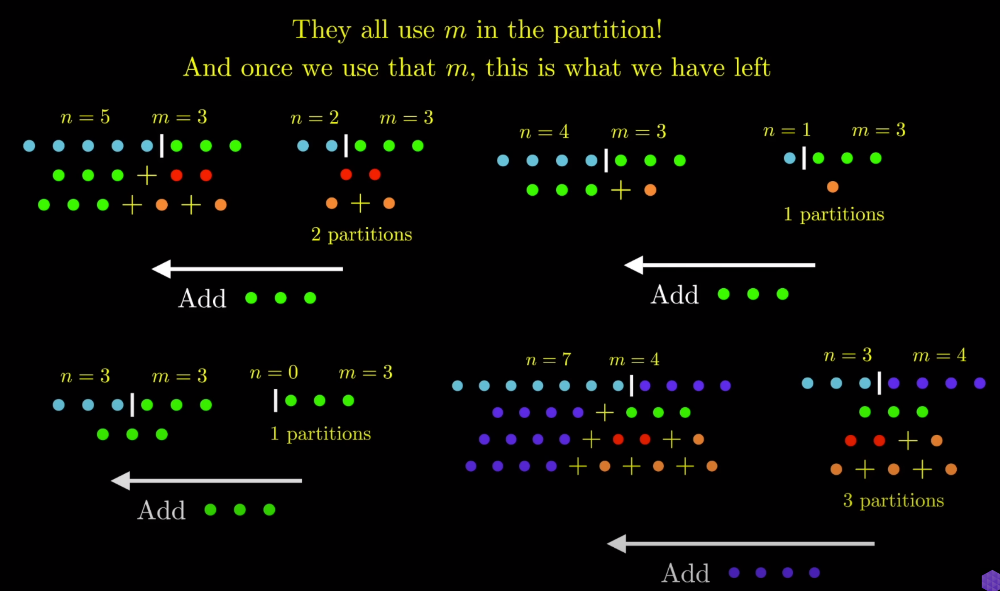

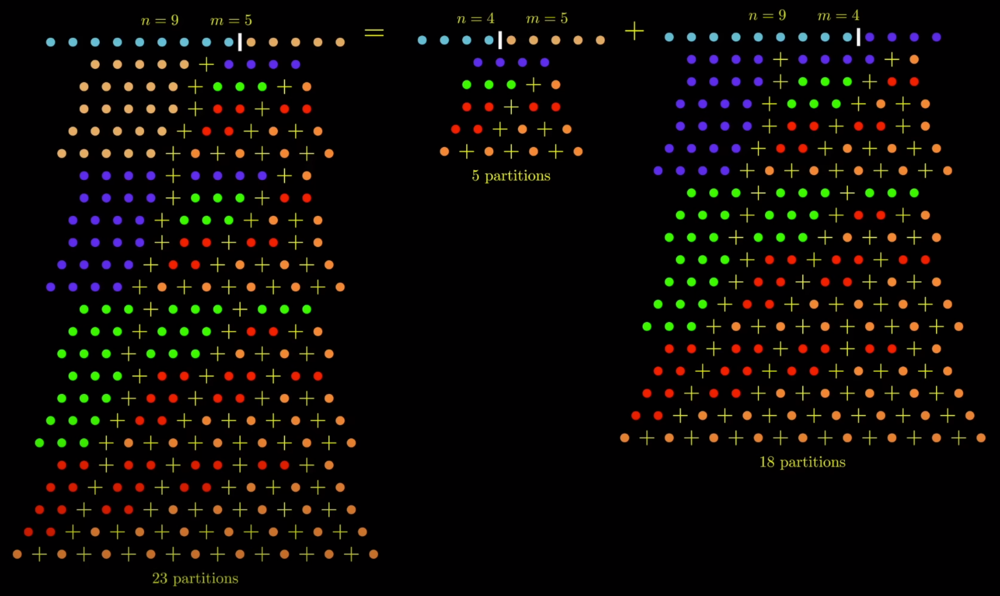

$$partition\:space(n,m)=\left\{\begin{matrix} 1 \: if \: n=0
 \\ 0 \: if \: m=0 \:or\: n<0
 \\ partition\:space(n-m,m) + partition\:space(n,m-1)
\end{matrix}\right.$$

In [13]:
def partitions(n, m):
    # BASE CASE
    if n == 0:
        return 1
    if m == 0 or n < 0:
        return 0
    
    # RECURSIVE CASE
    return partitions(n - m, m) + partitions(n, m - 1)

partitions(5,2)

3

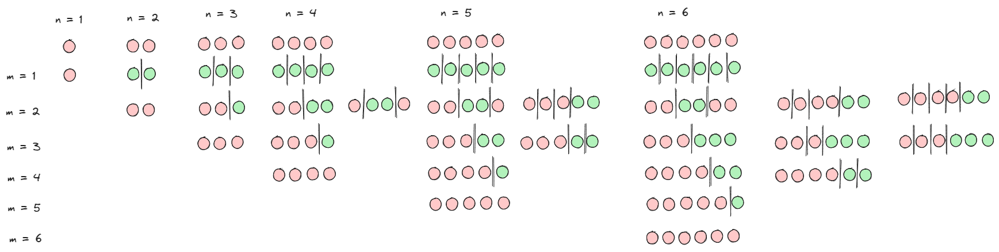

$n = 1$, $m = 1$

$m = 1: [1]$ $total = 1$

$n = 2$, $m = 2$

$m = 1: [1,1]$ $total = 1$

$m = 2: [2]$ $total = 2$

$n = 3$, $m = 3$

$m = 1: [1,1,1]$ $total = 1$

$m = 2: [2,1]$ $total = 2$

$m = 3: [3]$ $total = 3$

$n = 4$, $m = 4$

$m = 1: [1,1,1,1]$ $total = 1$

$m = 2: [2,2], [1,2,1]$ $total = 3$

$m = 3: [3,1]$ $total = 4$

$m = 4: [4]$ $total = 5$

$n = 5$, $m = 5$

$m = 1: [1,1,1,1,1]$ $total = 1$

$m = 2: [2,2,1], [1,1,1,2]$ $total = 3$

$m = 3: [3,2], [3,1,1]$ $total = 5$

$m = 4: [4,1]$ $total = 6$

$m = 5: [5]$ $total = 7$

$n = 6$, $m = 6$

$m = 1: [1,1,1,1,1,1]$ $total = 1$

$m = 2: [2,2,2], [1,1,2,2], [1,1,1,1,2]$ $total = 4$

$m = 3: [3,3], [2,1,3], [1,1,1,3]$ $total = 7$

$m = 4: [4,2], [4,1,1]$ $total = 9$

$m = 5: [5,1]$ $total = 10$

$m = 6: [6]$ $total = 11$

## Summary

- To understand recursion, you must first understand stacks.
- Recursion is hard to learn because the call stack is invisible.
- You always need at least one base case and one recursive case.
- Function calls push a frame object onto the stack, returning pops them off.
- Stack overflows happen when you make too many function calls without returning.
- Anything you can do with recursion you can do with a loop and a stack.
- Use recursion only when the problem has a tree-like structure and requires backtracking.
- Tail call elimination prevents stack overflows by preventing the call stack from growing. CPython doesn’t implement TCO.
- Memoization can speed up recursive algorithms by caching return values.
